# EDA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

%matplotlib inline

In [2]:
pd.set_option('display.max_columns', 500)


In [3]:
df = pd.read_csv('TravelInsurancePrediction.csv')

In [4]:
df.head()

,Unnamed: 0,Age,Employment Type,GraduateOrNot,AnnualIncome,FamilyMembers,ChronicDiseases,FrequentFlyer,EverTravelledAbroad,TravelInsurance
0,0,31,Government Sector,Yes,400000,6,1,No,No,0
1,1,31,Private Sector/Self Employed,Yes,1250000,7,0,No,No,0
2,2,34,Private Sector/Self Employed,Yes,500000,4,1,No,No,1
3,3,28,Private Sector/Self Employed,Yes,700000,3,1,No,No,0
4,4,28,Private Sector/Self Employed,Yes,700000,8,1,Yes,No,0


In [5]:
df.shape

(1987, 10)

In [6]:
df.info() #No missing value

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1987 entries, 0 to 1986
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Unnamed: 0           1987 non-null   int64 
 1   Age                  1987 non-null   int64 
 2   Employment Type      1987 non-null   object
 3   GraduateOrNot        1987 non-null   object
 4   AnnualIncome         1987 non-null   int64 
 5   FamilyMembers        1987 non-null   int64 
 6   ChronicDiseases      1987 non-null   int64 
 7   FrequentFlyer        1987 non-null   object
 8   EverTravelledAbroad  1987 non-null   object
 9   TravelInsurance      1987 non-null   int64 
dtypes: int64(6), object(4)
memory usage: 155.4+ KB


In [7]:
NUMERIC = ['Age', 'AnnualIncome', 'FamilyMembers']
CATEGORICAL = ['Employment Type', 'GraduateOrNot', 'ChronicDiseases', 'FrequentFlyer', 'EverTravelledAbroad']
TARGET = 'TravelInsurance'

In [8]:
# Ratio of target
ratio = df[TARGET].mean() #Imbalanced data with more 0; Only 35% of the data has travel insurance
ratio

0.3573225968797182

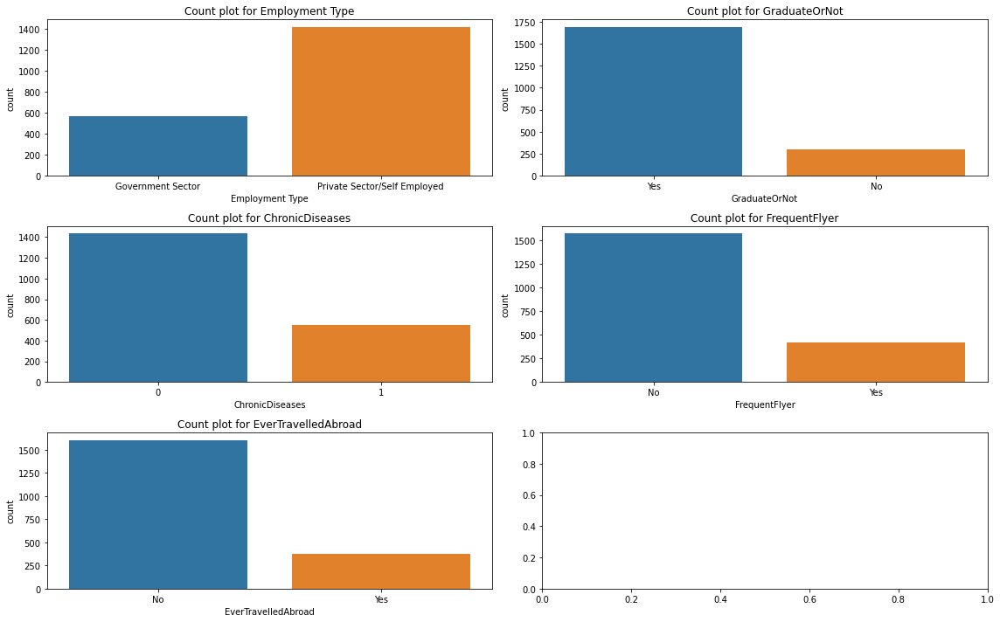

In [9]:
fig, axs = plt.subplots(3,2,figsize = (16,10), )
sns.countplot(data = df, x=CATEGORICAL[0], ax = axs[0,0])
axs[0,0].set_title(f'Count plot for {CATEGORICAL[0]}')
sns.countplot(data = df, x=CATEGORICAL[1], ax = axs[0,1])
axs[0,1].set_title(f'Count plot for {CATEGORICAL[1]}')
sns.countplot(data = df, x=CATEGORICAL[2], ax = axs[1,0])
axs[1,0].set_title(f'Count plot for {CATEGORICAL[2]}')
sns.countplot(data = df, x=CATEGORICAL[3], ax = axs[1,1])
axs[1,1].set_title(f'Count plot for {CATEGORICAL[3]}')
sns.countplot(data = df, x=CATEGORICAL[4], ax = axs[2,0])
axs[2,0].set_title(f'Count plot for {CATEGORICAL[4]}')
fig.tight_layout()
plt.show()
    

Text(0.5, 1.0, 'Count plot for FamilyMembers')

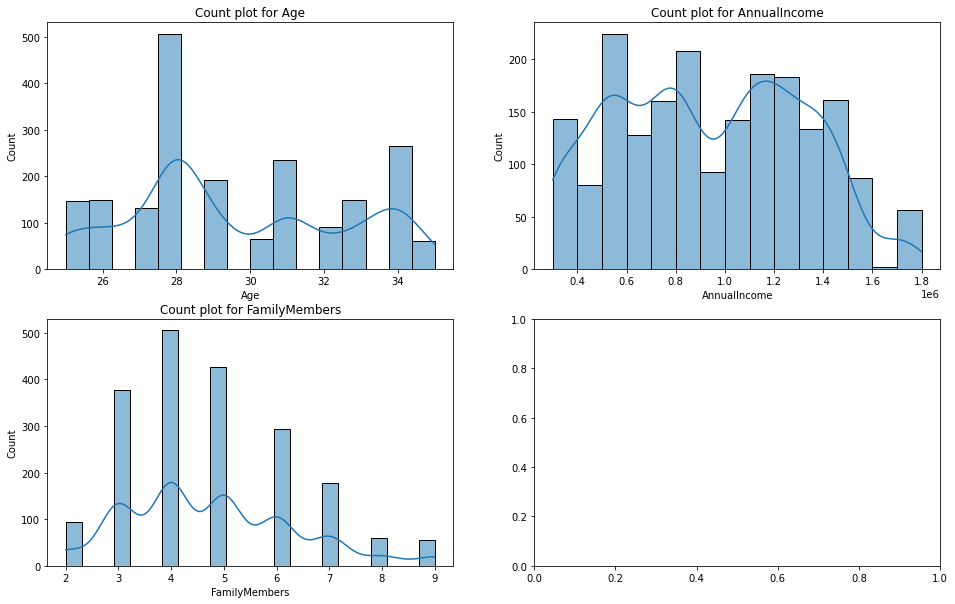

In [10]:
fig, axs = plt.subplots(2,2,figsize = (16,10))
sns.histplot(data = df, x=NUMERIC[0], kde=True, ax = axs[0,0])
axs[0,0].set_title(f'Count plot for {NUMERIC[0]}')
sns.histplot(data = df, x=NUMERIC[1],kde = True, ax = axs[0,1])
axs[0,1].set_title(f'Count plot for {NUMERIC[1]}')
sns.histplot(data = df, x=NUMERIC[2], kde=True, ax = axs[1,0])
axs[1,0].set_title(f'Count plot for {NUMERIC[2]}')


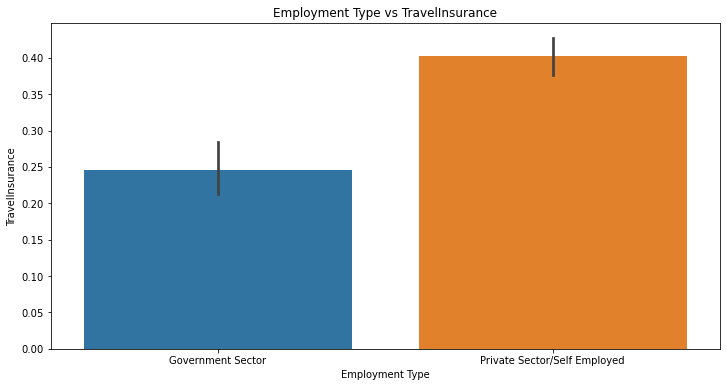

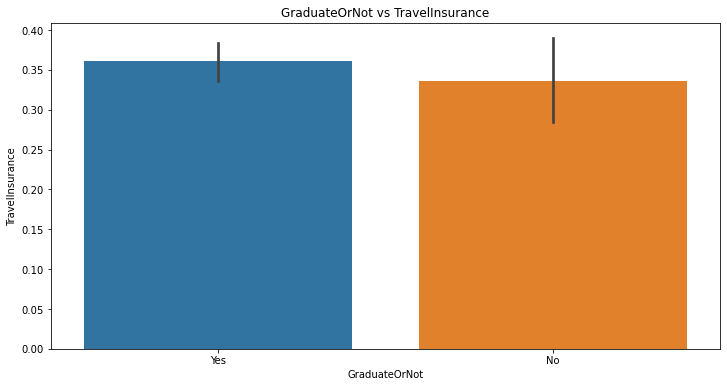

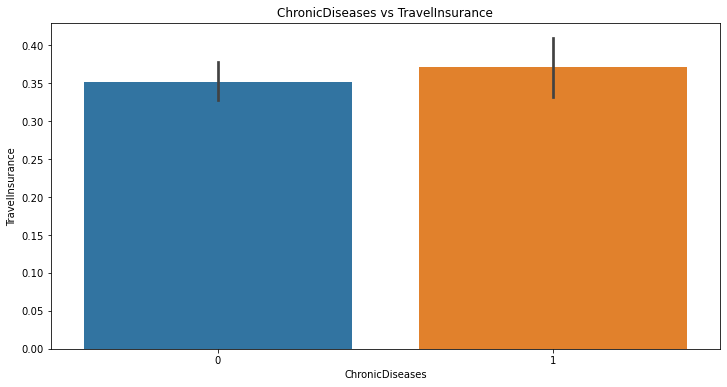

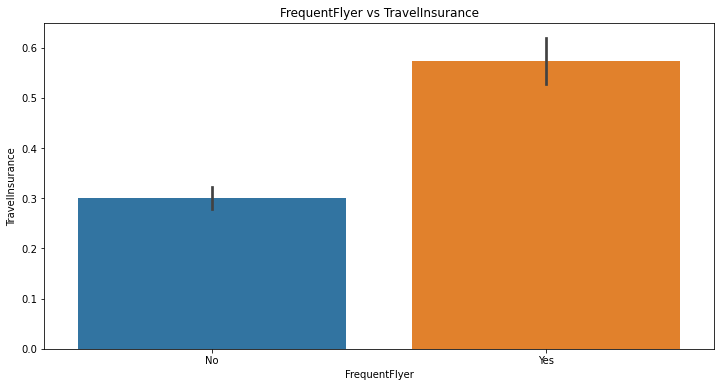

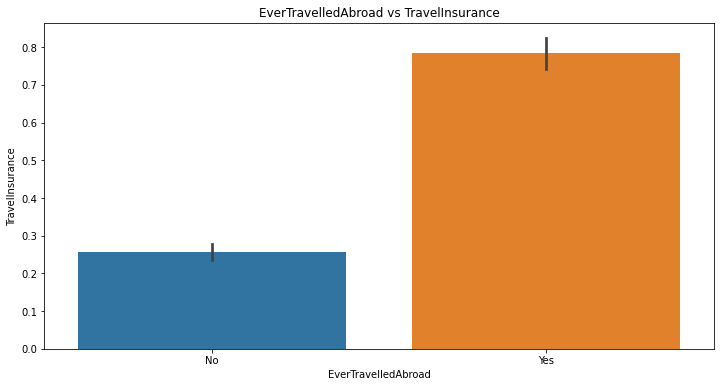

In [11]:
for c in CATEGORICAL:
    fig = plt.figure(figsize = (12,6))
    sns.barplot(data = df, x=c, y=TARGET)
    plt.title(f'{c} vs {TARGET}')
    plt.show()

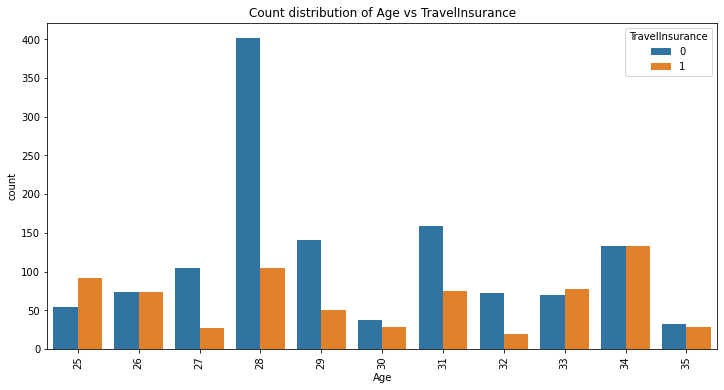

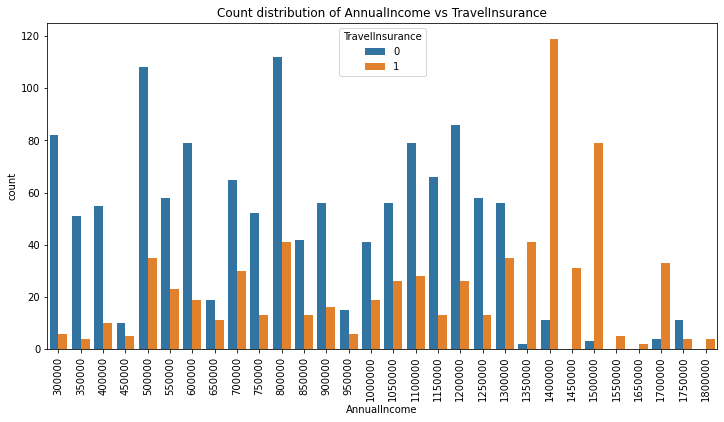

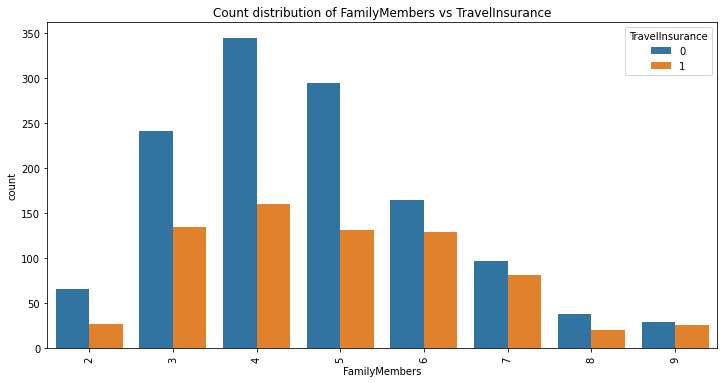

In [12]:
for c in NUMERIC:
    fig = plt.figure(figsize = (12,6))
    sns.countplot(x = c, data = df, hue = 'TravelInsurance')
    plt.xticks(rotation=90)
    plt.title(f'Count distribution of {c} vs {TARGET}')
    plt.show()

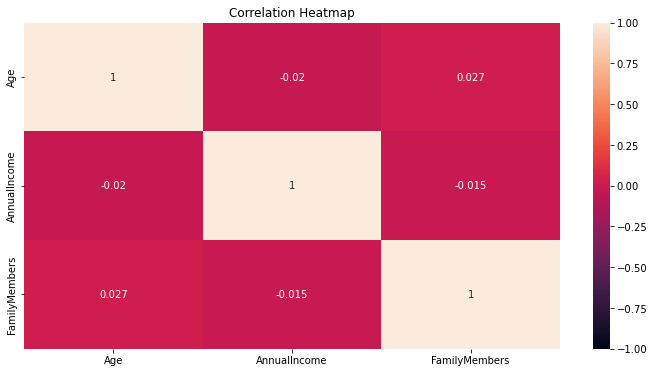

In [13]:
## No multicollinearity
df_num = df[NUMERIC]
df_corr = df_num.corr()
fig = plt.figure(figsize = (12,6))
sns.heatmap(df_corr, vmin=-1, vmax=1, annot=True)
plt.title('Correlation Heatmap')
plt.show()

# Modelling

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns   
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import tree, ensemble
from sklearn.metrics import classification_report, plot_roc_curve, plot_confusion_matrix, confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE


In [15]:
df = pd.read_csv("TravelInsurancePrediction.csv")

In [16]:
df.head()

,Unnamed: 0,Age,Employment Type,GraduateOrNot,AnnualIncome,FamilyMembers,ChronicDiseases,FrequentFlyer,EverTravelledAbroad,TravelInsurance
0,0,31,Government Sector,Yes,400000,6,1,No,No,0
1,1,31,Private Sector/Self Employed,Yes,1250000,7,0,No,No,0
2,2,34,Private Sector/Self Employed,Yes,500000,4,1,No,No,1
3,3,28,Private Sector/Self Employed,Yes,700000,3,1,No,No,0
4,4,28,Private Sector/Self Employed,Yes,700000,8,1,Yes,No,0


In [17]:
df['Employment Type'] = np.where(df['Employment Type']=='Government Sector', 1, 0)
df['GraduateOrNot'] = np.where(df['GraduateOrNot']=='Yes', 1, 0)
df['FrequentFlyer'] = np.where(df['FrequentFlyer'] == 'Yes', 1, 0)
df['EverTravelledAbroad'] = np.where(df['EverTravelledAbroad'] == 'Yes', 1, 0)

In [18]:
df.head()

,Unnamed: 0,Age,Employment Type,GraduateOrNot,AnnualIncome,FamilyMembers,ChronicDiseases,FrequentFlyer,EverTravelledAbroad,TravelInsurance
0,0,31,1,1,400000,6,1,0,0,0
1,1,31,0,1,1250000,7,0,0,0,0
2,2,34,0,1,500000,4,1,0,0,1
3,3,28,0,1,700000,3,1,0,0,0
4,4,28,0,1,700000,8,1,1,0,0


In [19]:
print(list(df))

['Unnamed: 0', 'Age', 'Employment Type', 'GraduateOrNot', 'AnnualIncome', 'FamilyMembers', 'ChronicDiseases', 'FrequentFlyer', 'EverTravelledAbroad', 'TravelInsurance']


In [20]:
df = df.dropna()

In [21]:
FEATURES = ['Age', 'Employment Type', 'GraduateOrNot', 'AnnualIncome', 'FamilyMembers', 'ChronicDiseases', 'FrequentFlyer', 'EverTravelledAbroad']
TARGET = 'TravelInsurance'

In [22]:
X = df[FEATURES]
y = df[TARGET]

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state = 42, test_size = 0.2)
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(1589, 8) (398, 8)
(1589,) (398,)


### Logistic Regression

In [24]:
from sklearn import linear_model
model = linear_model.LogisticRegression(random_state = 42)   #regression
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
model.fit(X_train_scaled, y_train) 

print("model: Logistic Regression")

print('Train set results')
train_pred = model.predict(X_train_scaled)
f1 = f1_score(y_train, train_pred)
prec = precision_score(y_train, train_pred)
rec = recall_score(y_train, train_pred)
acc = accuracy_score(y_train, train_pred)
print("Accuracy is:", acc)
print("F1 is:", f1)
print("Precision is:", prec)
print("Recall is:", rec)
print('')

print('Test set results')
pred = model.predict(X_test_scaled)
f1 = f1_score(y_test, pred)
prec = precision_score(y_test, pred)
rec = recall_score(y_test, pred)
acc = accuracy_score(y_test, pred)
print("Accuracy is:", acc)
print("F1 is:", f1)
print("Precision is:", prec)
print("Recall is:", rec)

model: Logistic Regression
Train set results
Accuracy is: 0.775959723096287
F1 is: 0.6188436830835118
Precision is: 0.7917808219178082
Recall is: 0.507908611599297

Test set results
Accuracy is: 0.7688442211055276
F1 is: 0.603448275862069
Precision is: 0.7692307692307693
Recall is: 0.49645390070921985


In [25]:
target_names = ['0','1']
print(classification_report(y_test, pred, target_names= target_names))

              precision    recall  f1-score   support

           0       0.77      0.92      0.84       257
           1       0.77      0.50      0.60       141

    accuracy                           0.77       398
   macro avg       0.77      0.71      0.72       398
weighted avg       0.77      0.77      0.75       398



/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


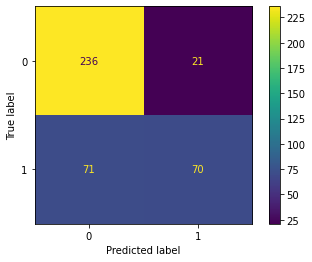

In [26]:
plot_confusion_matrix(model, X_test_scaled, y_test) 

/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


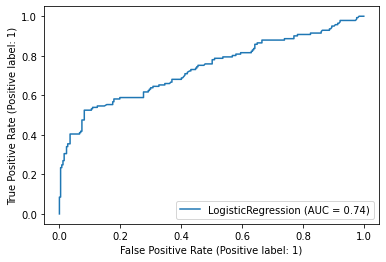

In [27]:
plot_roc_curve(model, X_test_scaled, y_test)
plt.show()

### CART

In [28]:
model = tree.DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)    #train the model

DecisionTreeClassifier(random_state=42)

In [29]:
pred = model.predict(X_test)   #run model with test set

In [30]:
# Train set performance
train_pred = model.predict(X_train)
f1 = f1_score(y_train, train_pred)
prec = precision_score(y_train, train_pred)
rec = recall_score(y_train, train_pred)
acc = accuracy_score(y_train, train_pred)
print("Accuracy is:", acc)
print("F1 is:", f1)
print("Precision is:", prec)
print("Recall is:", rec)

Accuracy is: 0.9225928256765261
F1 is: 0.8825214899713467
Precision is: 0.9665271966527197
Recall is: 0.81195079086116


In [31]:
print("model: DecisionTreeClassifier")
f1 = f1_score(y_test, pred)
prec = precision_score(y_test, pred)
rec = recall_score(y_test, pred)
acc = accuracy_score(y_test, pred)
print("Accuracy is:", acc)
print("F1 is:", f1)
print("Precision is:", prec)
print("Recall is:", rec)

model: DecisionTreeClassifier
Accuracy is: 0.8115577889447236
F1 is: 0.7126436781609196
Precision is: 0.775
Recall is: 0.6595744680851063


In [32]:
target_names = ['0','1']
print(classification_report(y_test, pred, target_names= target_names))

              precision    recall  f1-score   support

           0       0.83      0.89      0.86       257
           1       0.78      0.66      0.71       141

    accuracy                           0.81       398
   macro avg       0.80      0.78      0.79       398
weighted avg       0.81      0.81      0.81       398



/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


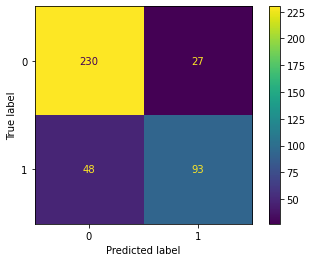

In [33]:
plot_confusion_matrix(model, X_test, y_test) 

/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


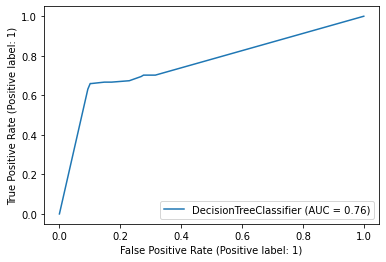

In [34]:
plot_roc_curve(model, X_test, y_test)
plt.show()

### Random Forest

In [35]:
model = ensemble.RandomForestClassifier(random_state= 42)
#model = ensemble.GradientBoostingClassifier()
model.fit(X_train, y_train) 

print("model: RandomForestClassifier")

print('Train set results')
train_pred = model.predict(X_train)
f1 = f1_score(y_train, train_pred)
prec = precision_score(y_train, train_pred)
rec = recall_score(y_train, train_pred)
acc = accuracy_score(y_train, train_pred)
print("Accuracy is:", acc)
print("F1 is:", f1)
print("Precision is:", prec)
print("Recall is:", rec)
print('')

print('Test set results')
pred = model.predict(X_test)
f1 = f1_score(y_test, pred)
prec = precision_score(y_test, pred)
rec = recall_score(y_test, pred)
acc = accuracy_score(y_test, pred)
print("Accuracy is:", acc)
print("F1 is:", f1)
print("Precision is:", prec)
print("Recall is:", rec)

model: RandomForestClassifier
Train set results
Accuracy is: 0.9225928256765261
F1 is: 0.8862164662349676
Precision is: 0.935546875
Recall is: 0.8418277680140598

Test set results
Accuracy is: 0.8165829145728644
F1 is: 0.7137254901960784
Precision is: 0.7982456140350878
Recall is: 0.6453900709219859


In [36]:
from sklearn.metrics import classification_report
target_names = ['0','1']
print(classification_report(y_test, pred, target_names= target_names))

              precision    recall  f1-score   support

           0       0.82      0.91      0.87       257
           1       0.80      0.65      0.71       141

    accuracy                           0.82       398
   macro avg       0.81      0.78      0.79       398
weighted avg       0.81      0.82      0.81       398



/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


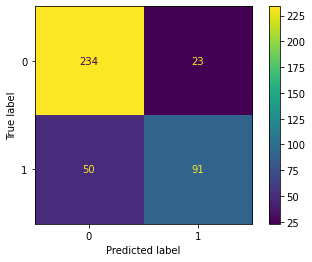

In [37]:
plot_confusion_matrix(model, X_test, y_test) 

/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


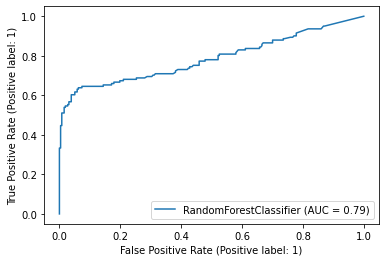

In [38]:
plot_roc_curve(model, X_test, y_test)
plt.show()

### XGBoost

In [39]:
model = ensemble.GradientBoostingClassifier(random_state=42)
#model = ensemble.GradientBoostingClassifier()
model.fit(X_train, y_train) 

print("model: GradientBoostingClassifier")

print('Train set results')
train_pred = model.predict(X_train)
f1 = f1_score(y_train, train_pred)
prec = precision_score(y_train, train_pred)
rec = recall_score(y_train, train_pred)
acc = accuracy_score(y_train, train_pred)
print("Accuracy is:", acc)
print("F1 is:", f1)
print("Precision is:", prec)
print("Recall is:", rec)
print('')

print('Test set results')
pred = model.predict(X_test)
f1 = f1_score(y_test, pred)
prec = precision_score(y_test, pred)
rec = recall_score(y_test, pred)
acc = accuracy_score(y_test, pred)
print("Accuracy is:", acc)
print("F1 is:", f1)
print("Precision is:", prec)
print("Recall is:", rec)

model: GradientBoostingClassifier
Train set results
Accuracy is: 0.842039018250472
F1 is: 0.733828207847296
Precision is: 0.9251336898395722
Recall is: 0.6080843585237259

Test set results
Accuracy is: 0.8442211055276382
F1 is: 0.7207207207207208
Precision is: 0.9876543209876543
Recall is: 0.5673758865248227


In [40]:
target_names = ['0','1']
print(classification_report(y_test, pred, target_names= target_names))

              precision    recall  f1-score   support

           0       0.81      1.00      0.89       257
           1       0.99      0.57      0.72       141

    accuracy                           0.84       398
   macro avg       0.90      0.78      0.81       398
weighted avg       0.87      0.84      0.83       398



/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


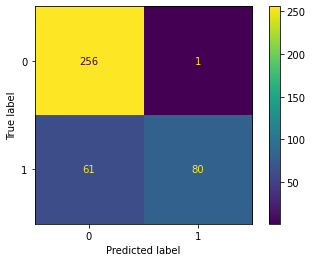

In [41]:
plot_confusion_matrix(model, X_test, y_test) 

/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


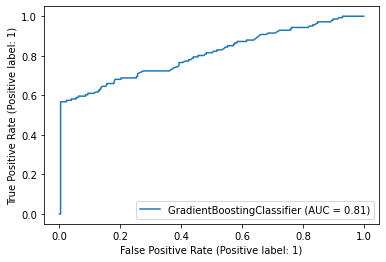

In [42]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(model, X_test, y_test)
plt.show()

## Hyperparameter Tuning

### Without Oversampling

In [45]:
CV_gb.best_score_

0.8363852528206775

In [46]:
y_pred = CV_gb.predict(X_test)
target_names = ['0','1']
print(classification_report(y_test, y_pred, target_names= target_names))

              precision    recall  f1-score   support

           0       0.81      1.00      0.89       257
           1       0.99      0.57      0.72       141

    accuracy                           0.84       398
   macro avg       0.90      0.78      0.81       398
weighted avg       0.87      0.84      0.83       398



/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


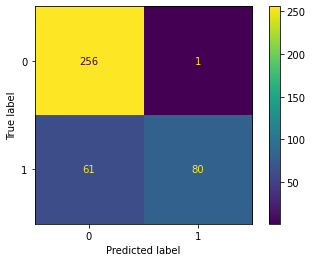

In [47]:
plot_confusion_matrix(CV_gb.best_estimator_, X_test, y_test) 

### With Oversampling

In [48]:
smote = SMOTE(random_state = 42)
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

In [49]:
gb_over=ensemble.GradientBoostingClassifier(random_state=42, subsample = 0.9)
param_grid = { 
    'n_estimators': [200, 250, 300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [3,5, None],
    'min_samples_leaf': [2, 5, 10],
    "learning_rate": [0.01, 0.05, 0.1]
}
CV_gb_over = GridSearchCV(estimator=gb_over, param_grid=param_grid, cv= 3)
CV_gb_over.fit(X_train_oversampled, y_train_oversampled)

/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the p

GridSearchCV(cv=3,
             estimator=GradientBoostingClassifier(random_state=42,
                                                  subsample=0.9),
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 5, None],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [2, 5, 10],
                         'n_estimators': [200, 250, 300]})

In [50]:
CV_gb_over.best_params_

{'learning_rate': 0.01,
 'max_depth': None,
 'max_features': 'log2',
 'min_samples_leaf': 5,
 'n_estimators': 250}

In [51]:
CV_gb_over.best_score_

0.7838235294117647

In [52]:
y_pred = CV_gb_over.predict(X_test)
target_names = ['0','1']
print(classification_report(y_test, y_pred, target_names= target_names))

              precision    recall  f1-score   support

           0       0.83      0.91      0.87       257
           1       0.81      0.65      0.72       141

    accuracy                           0.82       398
   macro avg       0.82      0.78      0.80       398
weighted avg       0.82      0.82      0.82       398



/Users/christophermok/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


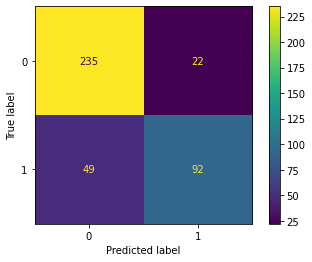

In [53]:
plot_confusion_matrix(CV_gb_over.best_estimator_, X_test, y_test) 